# Тест агента

**наш агент** (`agent_bundle_swarm 2/agent.py`) vs оппоненты

| Имя | Описание |
|-----|----------|
| `sub2` | Стандартный Kaggle-бенчмарк. WorldModel, WAIT_STRIKE, DOOMED_EVAC |
| `opp_exposed` | Топ-решение. Всё что у sub2 + TERMINAL_LAUNCH + TIE_HUNT |
| `opp_1101` | exposed без эндшпиля (ранняя версия) |
| `opp_heuristic` | Простой эвристик (~240 строк). Для smoke-тестов |
| `noop` | Пустой агент. Для отладки |

Подробнее → `OPPONENTS.md`

In [1]:
import importlib.util, sys, os, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from kaggle_environments import make

HERE     = os.path.dirname(os.path.abspath("__file__")) if "__file__" in dir() else os.getcwd()
OUR_PATH = os.path.join(HERE, "agent_bundle_swarm 2", "agent.py")

# ── Все доступные оппоненты ──────────────────────────────────────────────
ALL_OPPONENTS = {
    'sub2':          os.path.join(HERE, 'sub2.py'),
    'opp_exposed':   os.path.join(HERE, 'opp_exposed.py'),
    'opp_1101':      os.path.join(HERE, 'opp_1101.py'),
    'opp_heuristic': os.path.join(HERE, 'opp_heuristic.py'),
    'our2_agent': os.path.join(HERE, "agent_bundle_swarm 2 tuned", "agent.py")
}

def load_agent(path, name):
    if name in sys.modules:
        del sys.modules[name]
    spec = importlib.util.spec_from_file_location(name, path)
    mod  = importlib.util.module_from_spec(spec)
    sys.modules[name] = mod
    spec.loader.exec_module(mod)
    return mod.agent

our_agent = load_agent(OUR_PATH, "our_agent")

# ════════════════════════════════════════════════════════════════
# ВЫБЕРИ ПРОТИВНИКА — это значение используется везде в ноутбуке
# 'sub2' | 'opp_exposed' | 'opp_1101' | 'opp_heuristic' | 'noop'
OPPONENT = 'opp_exposed'
# ════════════════════════════════════════════════════════════════

SEED = 4344  # один сид для дебаг-лога + визуализации

print("our_agent:", our_agent)
print("SEED     :", SEED)
print("OPPONENT :", OPPONENT)
print("\nДоступные оппоненты:")
for name, path in ALL_OPPONENTS.items():
    marker = " ◀ выбран" if name == OPPONENT else ""
    exists = "✓" if os.path.exists(path) else "✗ НЕ НАЙДЕН"
    print(f"  {name:<18} {exists}{marker}")


Loading environment cabt failed: dlopen(/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so, 0x0006): tried: '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file), '/System/Volumes/Preboot/Cryptexes/OS/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (no such file), '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file)


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO: Successfully loaded OpenSpiel environments: 16.


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_backgammon


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_checkers


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_chess


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_connect_four


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_gin_rummy


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_go


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_goofspiel


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_hearts


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_hex


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_matching_pennies_3p


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_othello


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_repeated_game


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_tic_tac_toe


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_universal_poker


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_repeated_poker


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_python_repeated_pokerkit


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO: OpenSpiel games skipped: 1.


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    snake


our_agent: <function agent at 0x1380253a0>
SEED     : 4344
OPPONENT : opp_exposed

Доступные оппоненты:
  sub2               ✓
  opp_exposed        ✓ ◀ выбран
  opp_1101           ✓
  opp_heuristic      ✓
  our2_agent         ✓


## Дебаг-лог одного матча (наш + submission параллельно)

Запускает ОДИН матч (тот же `SEED`) с включённым per-turn логированием для **обоих** агентов:

- наш агент → `agent_debug.log` (зоны, приоритеты, все планы, причины FIRE/SKIP, итоговые движения).
- submission → `submission_debug.log` (modes, policy.attack_budget, все построенные missions с score).

Управление env vars:
- `ORBIT_AGENT_LOG` / `SUB_AGENT_LOG` — пути к лог-файлам (обязательно для активации).
- `ORBIT_AGENT_LOG_PLANS_ALL=1` — все кандидатные планы нашего агента.
- `ORBIT_AGENT_LOG_FLEETS=1` / `SUB_AGENT_LOG_FLEETS=1` — дамп летящих флотов.
- `SUB_AGENT_LOG_MISSIONS_ALL=1` — все missions submission (по умолчанию top-30).

После запуска: грепай `===== TURN N` в обоих файлах и сравнивай ход за ходом.

In [2]:
OUR_LOG = os.path.join(HERE, "agent_debug.log")
SUB_LOG = os.path.join(HERE, "submission_debug.log")

for _p in (OUR_LOG, SUB_LOG):
    if os.path.exists(_p):
        os.remove(_p)

os.environ["ORBIT_AGENT_LOG"]            = OUR_LOG
os.environ["ORBIT_AGENT_LOG_PLANS_ALL"]  = "1"
os.environ["ORBIT_AGENT_LOG_FLEETS"]     = "0"

os.environ["SUB_AGENT_LOG"]              = SUB_LOG
os.environ["SUB_AGENT_LOG_MISSIONS_ALL"] = "0"
os.environ["SUB_AGENT_LOG_FLEETS"]       = "0"

for _modname in ("our_agent", "agent_debug", "sub", "submission_debug"):
    if _modname in sys.modules:
        del sys.modules[_modname]

import agent_debug as _adbg
_adbg.reset()

our_agent_dbg = load_agent(OUR_PATH, "our_agent")

# Загружаем оппонента — sub2 оборачиваем в submission_debug, остальных напрямую
if OPPONENT == "noop":
    strong_agent_dbg = lambda obs, cfg=None: []
elif OPPONENT == "sub2":
    import submission_debug as _sdbg
    _sdbg.reset()
    _spec = importlib.util.spec_from_file_location("sub", ALL_OPPONENTS[OPPONENT])
    sub_mod_dbg = importlib.util.module_from_spec(_spec)
    sys.modules["sub"] = sub_mod_dbg
    _spec.loader.exec_module(sub_mod_dbg)
    strong_agent_dbg = _sdbg.wrap(sub_mod_dbg)
else:
    # opp_exposed, opp_1101, opp_heuristic — без патчинга
    _spec = importlib.util.spec_from_file_location("sub", ALL_OPPONENTS[OPPONENT])
    sub_mod_dbg = importlib.util.module_from_spec(_spec)
    sys.modules["sub"] = sub_mod_dbg
    _spec.loader.exec_module(sub_mod_dbg)
    strong_agent_dbg = sub_mod_dbg.agent

env_dbg = make("orbit_wars", debug=False, configuration={"seed": SEED})
env_dbg.run([our_agent_dbg, strong_agent_dbg])

final_dbg = env_dbg.steps[-1]
for i, s in enumerate(final_dbg):
    label = "our" if i == 0 else OPPONENT
    print(f"  P{i} ({label}): reward={s.reward}  status={s.status}  (seed={SEED})")

for label, path in [("our", OUR_LOG), ("sub", SUB_LOG)]:
    size = os.path.getsize(path) if os.path.exists(path) else 0
    print(f"\nЛог [{label}]: {path}  ({size:,} байт)")
    if size:
        with open(path, "r", encoding="utf-8") as f:
            tail = f.readlines()[-30:]
        print(f"--- последние {len(tail)} строк ---")
        print("".join(tail))

env_dbg.render(mode="ipython", width=800, height=600)


  P0 (our): reward=1  status=DONE  (seed=4344)
  P1 (opp_exposed): reward=-1  status=DONE  (seed=4344)

Лог [our]: /Users/adel/Documents/GitHub/OrbitWW/agent_debug.log  (2,104,993 байт)
--- последние 30 строк ---
[GUL]  phase=endgame(1.00) stance=consolidation ships=1.00 prod=31.00 COM_sep=37 dom=+1.00 opp=passive
[ADAPTIVE]  ratio=0.996  tier=dominate  top_n=16  prio_floor=-3.00
[ZONES]
   pid own zone              priority   prod ships  proj_at  area_inv  wnn_close mean_d   n_cr
    18   0 mid                 +0.63     4   104       0   +361.61    +1.00   45.9     0
    17   0 mid                 +0.62     4   111       0   +364.44    +1.00   45.9     0
    19   0 mid                 +0.54     4   171       0   +469.49    +1.00   46.3     0
     3   0 isolated            +0.23     5   110       0   +395.47    +1.00   62.3     0
     6   0 mid                 +0.19     4   112       0   +378.79    +1.00   55.9     0
     5   0 mid                 +0.19     4    84       0   +611.68   

## График: корабли и производство по ходам (дебаг-матч)

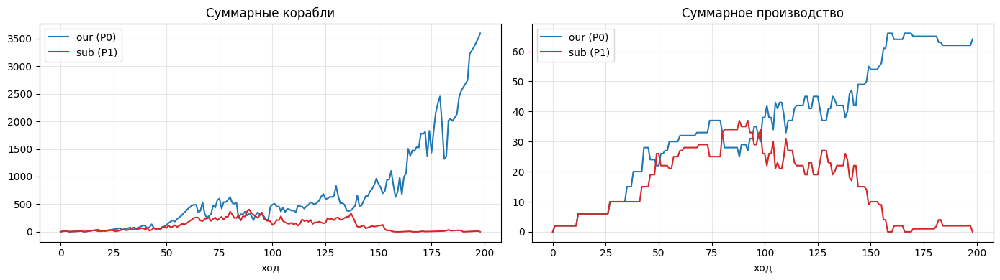

In [3]:
def extract_timeseries(env_obj):
    rows = []
    for step_idx, step in enumerate(env_obj.steps):
        obs     = step[0].observation
        planets = obs.get("planets", []) if isinstance(obs, dict) else obs.planets
        row     = {"step": step_idx}
        for pid in (0, 1):
            owned = [p for p in planets if (p[1] if isinstance(p, list) else p.owner) == pid]
            row[f"ships_p{pid}"] = sum(p[5] if isinstance(p, list) else p.ships for p in owned)
            row[f"prod_p{pid}"]  = sum(p[6] if isinstance(p, list) else p.production for p in owned)
        rows.append(row)
    return pd.DataFrame(rows)

ts = extract_timeseries(env_dbg)

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].plot(ts["step"], ts["ships_p0"], label="our (P0)", color="tab:blue")
axes[0].plot(ts["step"], ts["ships_p1"], label="sub (P1)", color="tab:red")
axes[0].set_title("Суммарные корабли"); axes[0].set_xlabel("ход")
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(ts["step"], ts["prod_p0"], label="our (P0)", color="tab:blue")
axes[1].plot(ts["step"], ts["prod_p1"], label="sub (P1)", color="tab:red")
axes[1].set_title("Суммарное производство"); axes[1].set_xlabel("ход")
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## Параллельный батч (ProcessPoolExecutor)

Запускает N матчей параллельно через `match_runner.run_match` (воркер в отдельном `.py` — требование macOS spawn-режима).  
Результаты: winrate, финальные корабли/производство, временны́е ряды для каждого матча.

In [4]:
from concurrent.futures import ProcessPoolExecutor, as_completed
from tqdm.notebook import tqdm
import time

if HERE not in sys.path:
    sys.path.insert(0, HERE)
from match_runner import run_match

# ── КОНФИГ БАТЧА ────────────────────────────────────────────────────────────
BATCH_SEEDS = list(range(30))      # ← количество/список сидов
N_WORKERS   = max(2, os.cpu_count() // 2)
# OPPONENT задан в первой ячейке ноутбука ↑
WEIGHTS     = {}                   # {} = дефолты SwarmWeights; {'neutral_garrison': 3, ...} — переопределения
# ────────────────────────────────────────────────────────────────────────────

tasks = [
    {'seed': s, 'our_path': OUR_PATH, 'opp': OPPONENT, 'weights': WEIGHTS, 'label': OPPONENT}
    for s in BATCH_SEEDS
]

print(f"Задач: {len(tasks)}  |  воркеров: {N_WORKERS}  |  оппонент: {OPPONENT}")
if WEIGHTS:
    print(f"Веса: {WEIGHTS}")


Задач: 30  |  воркеров: 5  |  оппонент: opp_exposed


In [5]:
# ── ЗАПУСК ──────────────────────────────────────────────────────────────────
results = []
errors  = []
t0 = time.time()

with ProcessPoolExecutor(max_workers=N_WORKERS) as ex:
    futs = {ex.submit(run_match, t): t for t in tasks}
    for fut in tqdm(as_completed(futs), total=len(tasks), desc="матчи"):
        try:
            r = fut.result()
            results.append(r)
        except Exception as e:
            task = futs[fut]
            errors.append((task['seed'], str(e)))
            print(f"  ERROR seed={task['seed']}: {e}")

elapsed = time.time() - t0
df = pd.DataFrame(results).sort_values('seed').reset_index(drop=True)

n    = len(df)
wins = int(df['win'].sum())
draws= int(df['draw'].sum())

print(f"\nГотово за {elapsed:.1f}s  ({elapsed/max(n,1):.1f}s/матч)")
print(f"Winrate: {wins}/{n} = {wins/max(n,1):.1%}  |  Ничьих: {draws}  |  Ошибок: {len(errors)}")
if errors:
    for seed, msg in errors:
        print(f"  seed={seed}: {msg}")

матчи:   0%|          | 0/30 [00:00<?, ?it/s]

Loading environment cabt failed: dlopen(/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so, 0x0006): tried: '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file), '/System/Volumes/Preboot/Cryptexes/OS/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (no such file), '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file)
[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO: Successfully loaded OpenSpiel environments: 16.
[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_backgammon
Loading environment cabt failed: dlopen(/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so, 0x0006): tried: '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_en


Готово за 136.7s  (4.6s/матч)
Winrate: 22/30 = 73.3%  |  Ничьих: 0  |  Ошибок: 0


## Результаты батча

In [6]:
# ── СВОДНАЯ ТАБЛИЦА ─────────────────────────────────────────────────────────
summary = pd.DataFrame({
    'метрика': [
        'матчей', 'побед', 'поражений', 'ничьих', 'winrate',
        'avg steps', 'avg ships_diff',
        'avg prod0_final', 'avg prod1_final',
        'avg ships0_final', 'avg ships1_final',
    ],
    'значение': [
        n, wins, n - wins - draws, draws,
        f"{wins/max(n,1):.1%}",
        f"{df['steps'].mean():.1f}",
        f"{df['ships_diff'].mean():+.1f}",
        f"{df['prod0_final'].mean():.1f}",
        f"{df['prod1_final'].mean():.1f}",
        f"{df['ships0_final'].mean():.0f}",
        f"{df['ships1_final'].mean():.0f}",
    ]
})
display(summary.set_index('метрика'))

# Детальная таблица по сидам
cols = ['seed', 'win', 'draw', 'steps', 'n0_final', 'n1_final',
        'ships_diff', 'prod0_final', 'prod1_final', 'time_sec']
display(df[cols].style.applymap(
    lambda v: 'background-color: #d4edda' if v == 1 else
              ('background-color: #f8d7da' if v == 0 else ''),
    subset=['win']
))

,значение
метрика,
матчей,30
побед,22
поражений,8
ничьих,0
winrate,73.3%
avg steps,189.2
avg ships_diff,+2342.3
avg prod0_final,54.2
avg prod1_final,19.9


/var/folders/xg/q82r22r5461fgsby1v63gp000000gn/T/ipykernel_68308/677481692.py:25: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  display(df[cols].style.applymap(


,seed,win,draw,steps,n0_final,n1_final,ships_diff,prod0_final,prod1_final,time_sec
0,0,1,0,215,32,0,4813.000000,72.000000,0.000000,27.000000
1,1,1,0,261,25,0,4513.000000,69.000000,0.000000,26.600000
2,2,1,0,128,32,0,4192.000000,84.000000,0.000000,9.700000
3,3,1,0,195,36,0,5835.000000,84.000000,0.000000,29.800000
4,4,0,0,187,0,28,-4026.000000,0.000000,92.000000,17.800000
5,5,0,0,226,0,32,-2804.000000,0.000000,64.000000,35.700000
6,6,1,0,234,36,0,4077.000000,64.000000,0.000000,35.200000
7,7,0,0,201,0,24,-2258.000000,0.000000,68.000000,18.800000
8,8,1,0,193,28,0,3798.000000,60.000000,0.000000,17.800000
9,9,1,0,186,28,0,4913.000000,72.000000,0.000000,19.300000


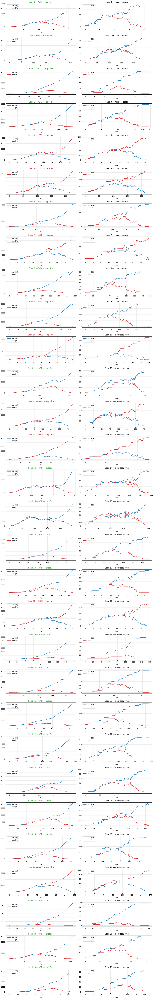

In [7]:
# ── ВРЕМЕННЫ́Е РЯДЫ: корабли + производство по каждому матчу ──────────────
n_seeds = len(df)
fig, axes = plt.subplots(n_seeds, 2, figsize=(14, 3 * n_seeds), squeeze=False)

for i, row in df.iterrows():
    seed  = row['seed']
    label = "WIN" if row['win'] else ("DRAW" if row['draw'] else "LOSS")
    title_color = "tab:green" if row['win'] else ("tab:orange" if row['draw'] else "tab:red")

    ax_s = axes[i, 0]
    ax_p = axes[i, 1]

    ax_s.plot(row['ts_ships0'], label='our (P0)', color='tab:blue')
    ax_s.plot(row['ts_ships1'], label='opp (P1)', color='tab:red')
    ax_s.set_title(f"Seed {seed} — {label} — корабли", color=title_color)
    ax_s.set_xlabel("ход"); ax_s.legend(); ax_s.grid(alpha=0.3)

    ax_p.plot(row['ts_prod0'], label='our (P0)', color='tab:blue')
    ax_p.plot(row['ts_prod1'], label='opp (P1)', color='tab:red')
    ax_p.set_title(f"Seed {seed} — производство")
    ax_p.set_xlabel("ход"); ax_p.legend(); ax_p.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [8]:
# ── СОХРАНИТЬ РЕЗУЛЬТАТЫ (опционально) ──────────────────────────────────────
from datetime import datetime
ts_str = datetime.now().strftime('%Y%m%d_%H%M%S')
out_dir = os.path.join(HERE, "out")
os.makedirs(out_dir, exist_ok=True)

# Сохраняем без временны́х рядов (они большие и не нужны в CSV)
save_cols = [c for c in df.columns if not c.startswith('ts_')]
out_csv = os.path.join(out_dir, f"batch_{OPPONENT}_{ts_str}.csv")
df[save_cols].to_csv(out_csv, index=False)
print(f"Сохранено: {out_csv}")

Сохранено: /Users/adel/Documents/GitHub/OrbitWW/out/batch_opp_exposed_20260520_222320.csv


## Сравнение всех оппонентов

Запускает одинаковый набор сидов против **каждого** оппонента и выводит сводную таблицу winrate.
Удобно для быстрой проверки: не деградировали ли против кого-то после изменений в агенте.

In [9]:
# ── КОНФИГ СРАВНЕНИЯ ────────────────────────────────────────────────────────
COMPARE_SEEDS    = list(range(30))   # ← сиды (одинаковые для всех оппонентов)
COMPARE_OPPS     = list(ALL_OPPONENTS.keys())  # ← все; или вручную: ['sub2', 'opp_exposed']
# Чтобы сравнить только с выбранным: COMPARE_OPPS = [OPPONENT]
COMPARE_WORKERS  = max(2, os.cpu_count() // 2)
COMPARE_WEIGHTS  = {}  # {} = текущие дефолты
# ────────────────────────────────────────────────────────────────────────────

compare_tasks = [
    {'seed': s, 'our_path': OUR_PATH, 'opp': opp, 'weights': COMPARE_WEIGHTS, 'label': opp}
    for opp in COMPARE_OPPS
    for s in COMPARE_SEEDS
]

compare_results = []
compare_errors  = []
t0 = time.time()

with ProcessPoolExecutor(max_workers=COMPARE_WORKERS) as ex:
    futs = {ex.submit(run_match, t): t for t in compare_tasks}
    for fut in tqdm(as_completed(futs), total=len(compare_tasks), desc='сравнение'):
        try:
            compare_results.append(fut.result())
        except Exception as e:
            task = futs[fut]
            compare_errors.append((task['label'], task['seed'], str(e)))
            print(f"  ERROR opp={task['label']} seed={task['seed']}: {e}")

elapsed = time.time() - t0
print(f"Готово за {elapsed:.1f}s  |  ошибок: {len(compare_errors)}")


сравнение:   0%|          | 0/150 [00:00<?, ?it/s]

Loading environment cabt failed: dlopen(/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so, 0x0006): tried: '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file), '/System/Volumes/Preboot/Cryptexes/OS/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (no such file), '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file)
[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO: Successfully loaded OpenSpiel environments: 16.
[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_backgammon
[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_checkers
[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_chess
[kaggle_environments.envs.open_spiel_env.open_spiel_en

  ERROR opp=our2_agent seed=0: unknown opp 'our2_agent': файл не найден: /Users/adel/Documents/GitHub/OrbitWW/our2_agent.py
  ERROR opp=our2_agent seed=1: unknown opp 'our2_agent': файл не найден: /Users/adel/Documents/GitHub/OrbitWW/our2_agent.py
  ERROR opp=our2_agent seed=2: unknown opp 'our2_agent': файл не найден: /Users/adel/Documents/GitHub/OrbitWW/our2_agent.py
  ERROR opp=our2_agent seed=3: unknown opp 'our2_agent': файл не найден: /Users/adel/Documents/GitHub/OrbitWW/our2_agent.py
  ERROR opp=our2_agent seed=4: unknown opp 'our2_agent': файл не найден: /Users/adel/Documents/GitHub/OrbitWW/our2_agent.py
  ERROR opp=our2_agent seed=5: unknown opp 'our2_agent': файл не найден: /Users/adel/Documents/GitHub/OrbitWW/our2_agent.py
  ERROR opp=our2_agent seed=6: unknown opp 'our2_agent': файл не найден: /Users/adel/Documents/GitHub/OrbitWW/our2_agent.py
  ERROR opp=our2_agent seed=7: unknown opp 'our2_agent': файл не найден: /Users/adel/Documents/GitHub/OrbitWW/our2_agent.py
  ERROR 

Готово за 401.9s  |  ошибок: 30


/var/folders/xg/q82r22r5461fgsby1v63gp000000gn/T/ipykernel_68308/2176543265.py:26: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  display(agg.set_index('label').style.applymap(color_winrate, subset=['winrate']))


,winrate,draws,avg_diff,avg_steps,n
label,,,,,
opp_exposed,0.633000,0.000000,1489,203.200000,30
sub2,0.633000,0.000000,2019,189.500000,30
opp_1101,0.567000,0.000000,1550,196.500000,30
opp_heuristic,0.533000,0.000000,-260,168.900000,30


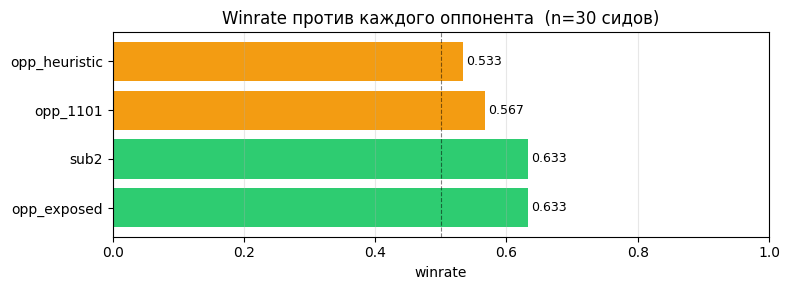

In [10]:
# ── СВОДНАЯ ТАБЛИЦА СРАВНЕНИЯ ────────────────────────────────────────────────
df_all = pd.DataFrame(compare_results)

agg = (
    df_all.groupby('label')
    .agg(
        winrate  =('win',        'mean'),
        draws    =('draw',       'mean'),
        avg_diff =('ships_diff', 'mean'),
        avg_steps=('steps',      'mean'),
        n        =('win',        'count'),
    )
    .reset_index()
    .sort_values('winrate', ascending=False)
)
agg['winrate'] = agg['winrate'].round(3)
agg['draws']   = agg['draws'].round(3)
agg['avg_diff']= agg['avg_diff'].round(0).astype(int)
agg['avg_steps']= agg['avg_steps'].round(1)

def color_winrate(val):
    if val >= 0.6:  return 'background-color: #d4edda'
    if val >= 0.45: return 'background-color: #fff3cd'
    return 'background-color: #f8d7da'

display(agg.set_index('label').style.applymap(color_winrate, subset=['winrate']))

# ── График winrate по оппонентам ───────────────────────────────────────────
fig, ax = plt.subplots(figsize=(8, 3))
colors = ['#2ecc71' if v >= 0.6 else '#f39c12' if v >= 0.45 else '#e74c3c'
          for v in agg['winrate']]
bars = ax.barh(agg['label'], agg['winrate'], color=colors)
ax.axvline(0.5, color='black', linestyle='--', linewidth=0.8, alpha=0.5)
for bar, val in zip(bars, agg['winrate']):
    ax.text(bar.get_width() + 0.005, bar.get_y() + bar.get_height()/2,
            f'{val:.3f}', va='center', fontsize=9)
ax.set_xlim(0, 1)
ax.set_xlabel('winrate')
ax.set_title(f'Winrate против каждого оппонента  (n={len(COMPARE_SEEDS)} сидов)')
ax.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()


/var/folders/xg/q82r22r5461fgsby1v63gp000000gn/T/ipykernel_68308/699627148.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot = df_all2.pivot_table(index='label', columns='seed_bin', values='win', aggfunc='mean')


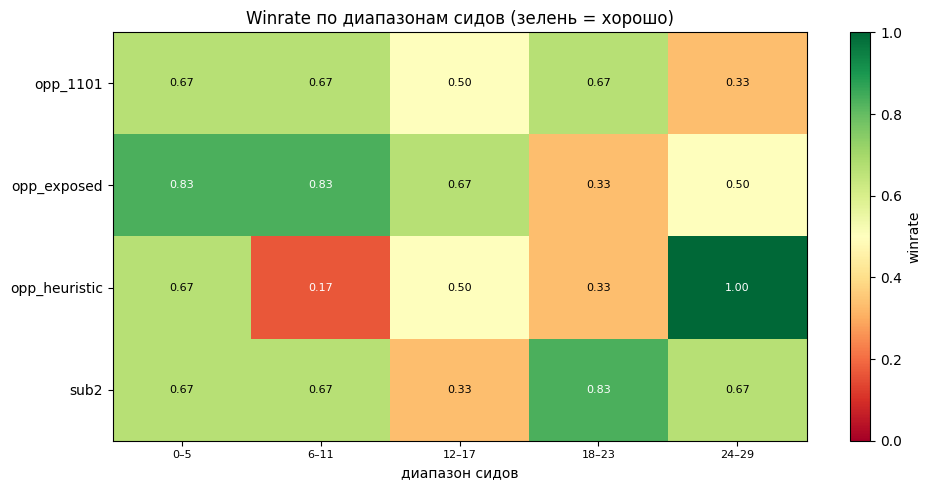

In [11]:
# ── HEATMAP: winrate по оппоненту × диапазону сидов ────────────────────────
# Разбивает сиды на квинтили — видно если агент хуже на конкретных картах
df_all2 = df_all.copy()
n_bins  = 5
df_all2['seed_bin'] = pd.cut(df_all2['seed'], bins=n_bins,
                              labels=[f'{i*len(COMPARE_SEEDS)//n_bins}–{(i+1)*len(COMPARE_SEEDS)//n_bins-1}'
                                      for i in range(n_bins)])
pivot = df_all2.pivot_table(index='label', columns='seed_bin', values='win', aggfunc='mean')

fig, ax = plt.subplots(figsize=(10, len(COMPARE_OPPS) * 0.8 + 1))
im = ax.imshow(pivot.values, aspect='auto', cmap='RdYlGn', vmin=0, vmax=1)
ax.set_xticks(range(len(pivot.columns)))
ax.set_xticklabels(pivot.columns, fontsize=8)
ax.set_yticks(range(len(pivot.index)))
ax.set_yticklabels(pivot.index)
for i in range(len(pivot.index)):
    for j in range(len(pivot.columns)):
        val = pivot.values[i, j]
        ax.text(j, i, f'{val:.2f}', ha='center', va='center', fontsize=8,
                color='black' if 0.3 < val < 0.8 else 'white')
plt.colorbar(im, ax=ax, label='winrate')
ax.set_title('Winrate по диапазонам сидов (зелень = хорошо)')
ax.set_xlabel('диапазон сидов')
plt.tight_layout()
plt.show()
